In [35]:
import os
import csv
from pyexpat import features

import umap
import json
import librosa
import numpy as np
import matplotlib.pyplot as plt
from sklearn import preprocessing
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.preprocessing import MinMaxScaler
import pandas as pd
import seaborn as sns
def wavenet_encode(file_path):
    encoding = np.load(file_path)
    return encoding.reshape((-1, 16))


In [36]:

def list_folders(directory):
    return [name for name in os.listdir(directory) if os.path.isdir(os.path.join(directory, name))]
genres =list_folders('../data/features/sequential/mfcc')
def list_files(directory):
    return [name for name in os.listdir(directory) if os.path.isfile(os.path.join(directory, name))]


In [37]:
X=[]
y=[]

mfcc_size = 13
dataset =[]

In [38]:
# load dataset, first row is header

dataset = pd.read_csv('../data/features/aggregated/genrefeatures.csv', header=0)

In [47]:
# unpack dataset into components
all_file_paths = dataset['file'].tolist()
wavenet_features = dataset['wavnet'].apply(lambda x: np.fromstring(x.strip('[]'), sep=' ')).tolist()
mfcc_features = dataset['mfcc'].apply(lambda x: np.fromstring(x.strip('[]'), sep=' ')).tolist()
y = dataset['class'].tolist()


wavenet_features = np.nan_to_num(np.array(wavenet_features))
mfcc_features = np.array(mfcc_features)

mfcc_tuples = []

wavenet_tuples = []

all_json = dict()
all_json["filenames"] = all_file_paths

print(len(all_file_paths),
      wavenet_features.shape,
      mfcc_features.shape)

1000 (1000, 48) (1000, 39)


In [40]:
def get_scaled_tsne_embeddings(features, perplexity, iteration):
    embedding = TSNE(n_components=2,
                     perplexity=perplexity,
                     n_iter=iteration).fit_transform(features)
    scaler = MinMaxScaler()
    scaler.fit(embedding)
    return scaler.transform(embedding)


def transform_numpy_to_json(array):
    data = []
    for position in array:
        data.append({
            'coordinates': position.tolist()
        })
    return data


In [41]:
def get_scaled_tsne_embeddings(features, perplexity, iteration):
    embedding = TSNE(n_components=2,
                     perplexity=perplexity,
                     n_iter=iteration).fit_transform(features)
    scaler = MinMaxScaler()
    scaler.fit(embedding)
    return scaler.transform(embedding)


def transform_numpy_to_json(array):
    data = []
    for position in array:
        data.append({
            'coordinates': position.tolist()
        })
    return data


tnse_embeddings_mfccs = []
tnse_embeddings_wavenet = []
perplexities = [2, 5, 30, 50]
iterations = [250, 500, 1000, 2000, 5000]
for i, perplexity in enumerate(perplexities):
    for j, iteration in enumerate(iterations):
        tsne_mfccs = get_scaled_tsne_embeddings(mfcc_features,
                                                perplexity,
                                                iteration)

        tnse_wavenet = get_scaled_tsne_embeddings(wavenet_features,
                                                  perplexity,
                                                  iteration)
        tnse_embeddings_mfccs.append(tsne_mfccs)
        tnse_embeddings_wavenet.append(tnse_wavenet)

        mfcc_key = 'tsnemfcc{}{}'.format(i, j)
        wavenet_key = 'tsnewavenet{}{}'.format(i, j)

        all_json[mfcc_key] = transform_numpy_to_json(tsne_mfccs)
        all_json[wavenet_key] = transform_numpy_to_json(tnse_wavenet)

In [48]:
uniq_labels = np.unique(y)
colors = plt.cm.rainbow(np.linspace(0, 1, len(uniq_labels)))

In [49]:
tnse_embeddings_mfccs
uniq_labels

array(['blues', 'classical', 'country', 'disco', 'hiphop', 'jazz',
       'metal', 'pop', 'reggae', 'rock'], dtype='<U9')

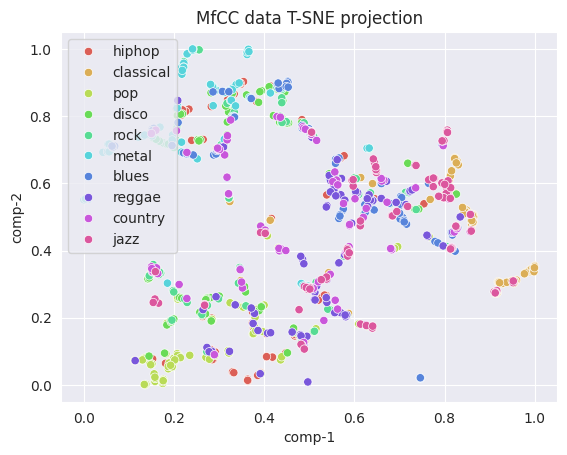

Connection closed unexpectedly!


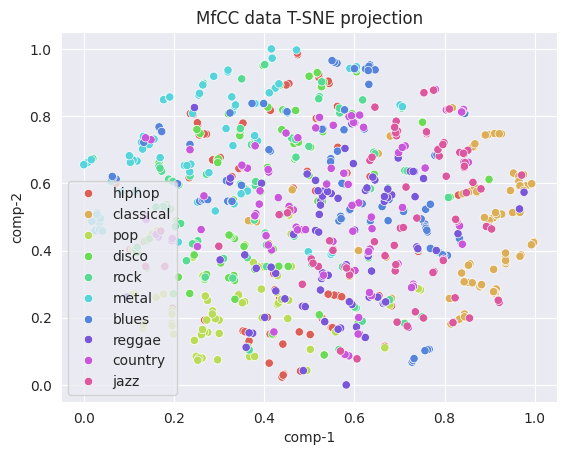

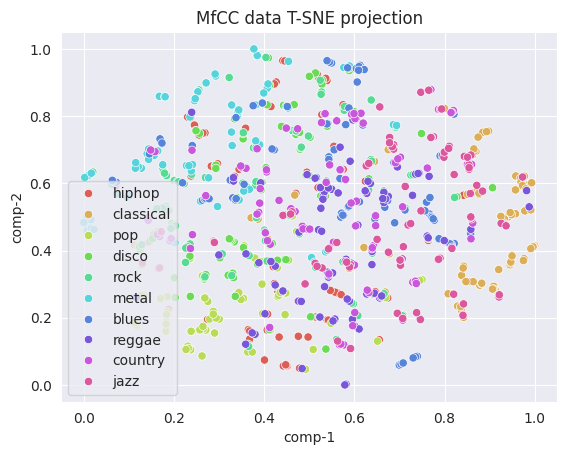

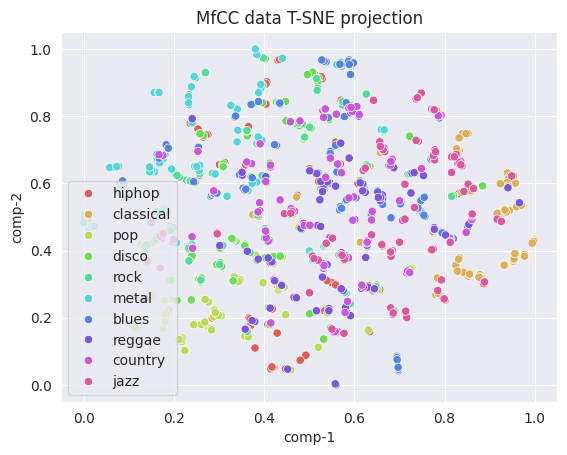

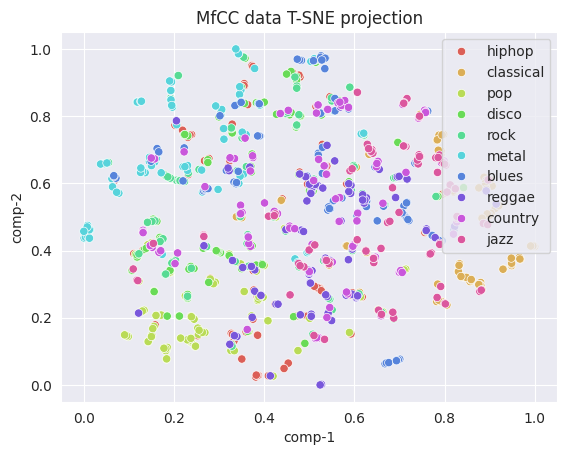

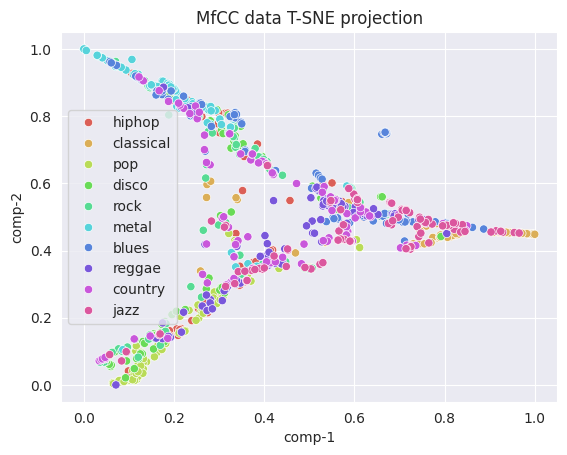

...

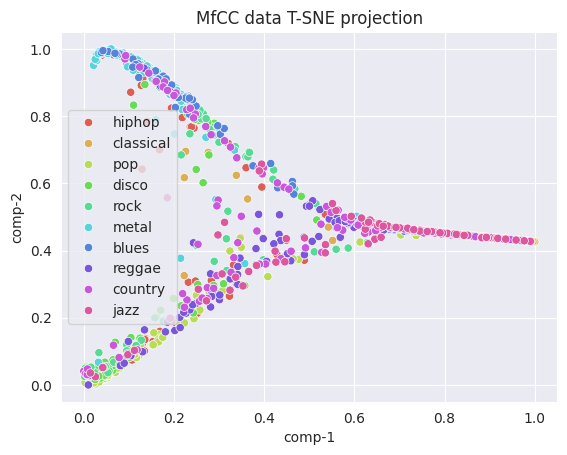

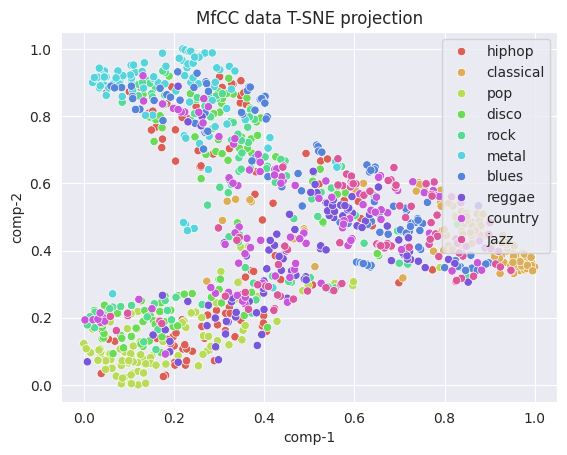

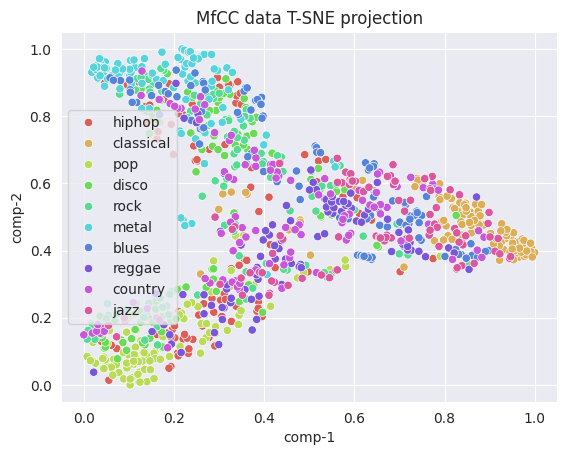

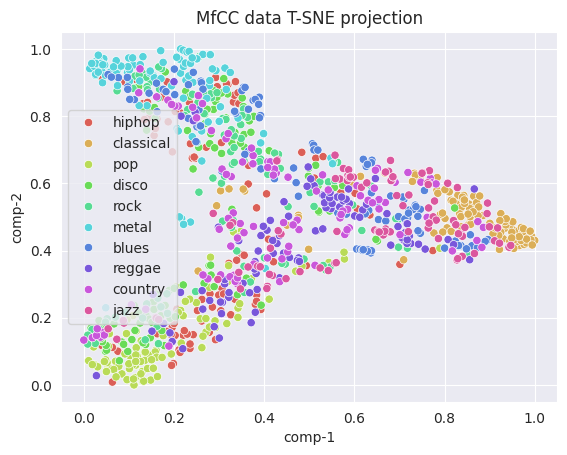

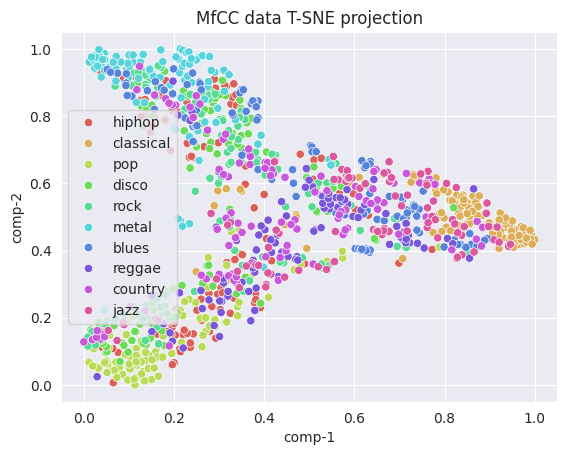

In [52]:

df = pd.DataFrame()
labels = list(y)
df = pd.DataFrame()
df["y"] = labels
for i in range(len(tnse_embeddings_mfccs)):
    current_plot = i
    df["comp-1"] = tnse_embeddings_mfccs[current_plot].T[0]
    df["comp-2"] = tnse_embeddings_mfccs[current_plot].T[1]
    sns.scatterplot(x="comp-1", y="comp-2", hue=df.y.tolist(),
                palette=sns.color_palette("hls", 10),
                data=df).set(title="MfCC data T-SNE projection")
    plt.show()

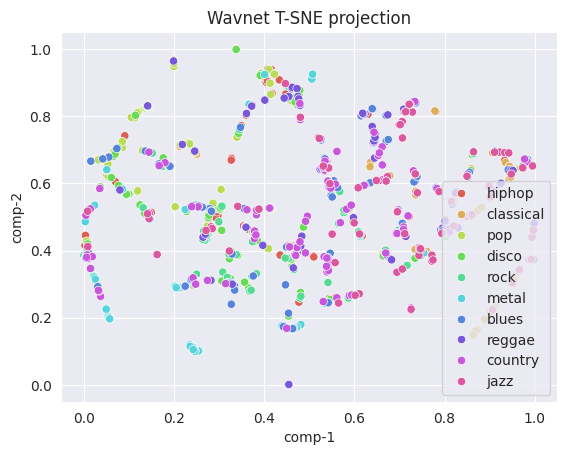

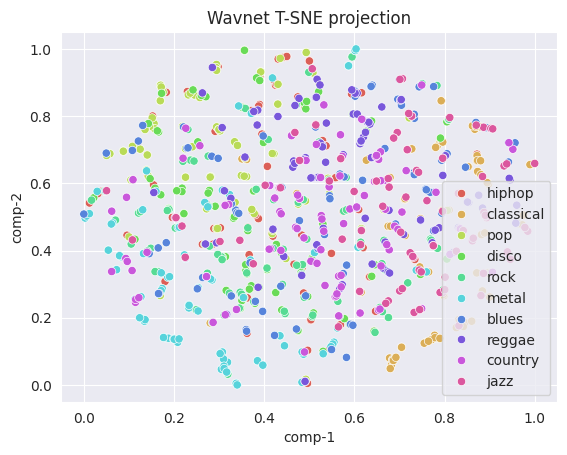

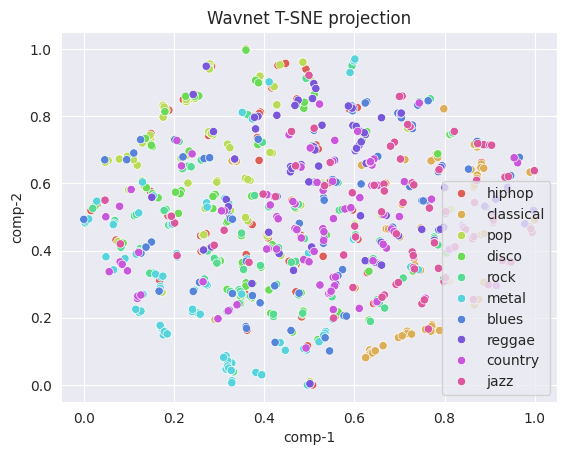

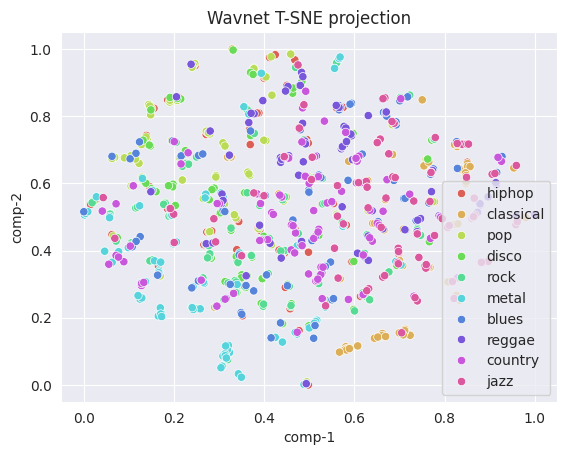

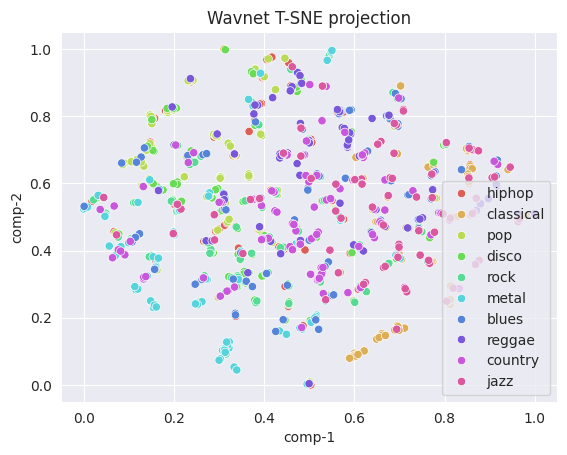

...

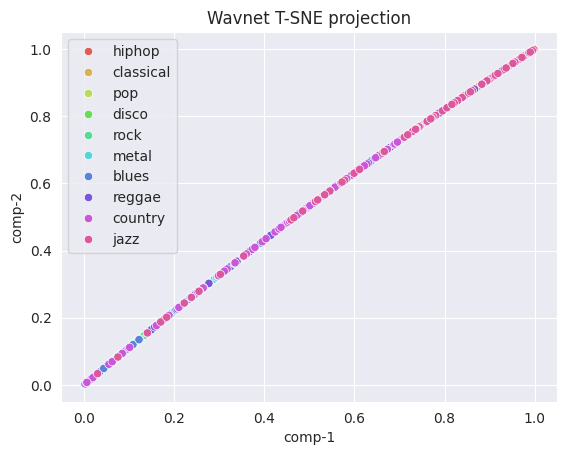

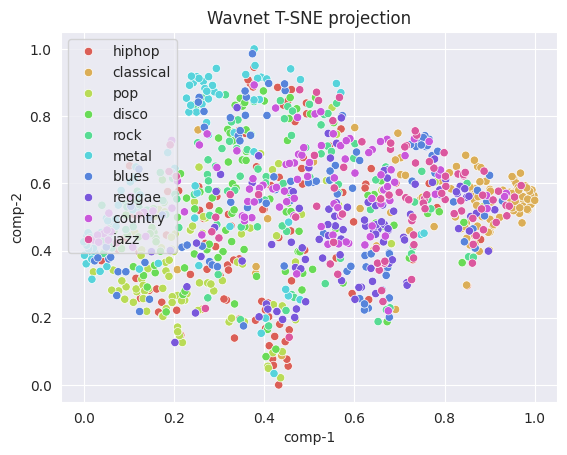

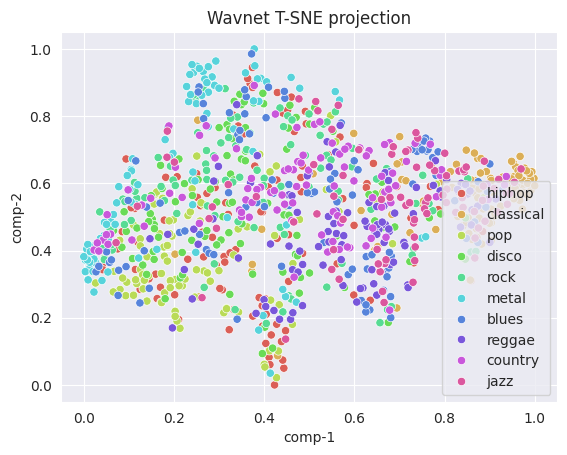

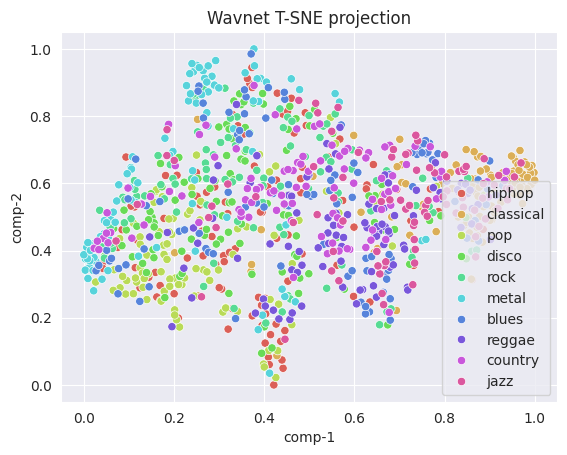

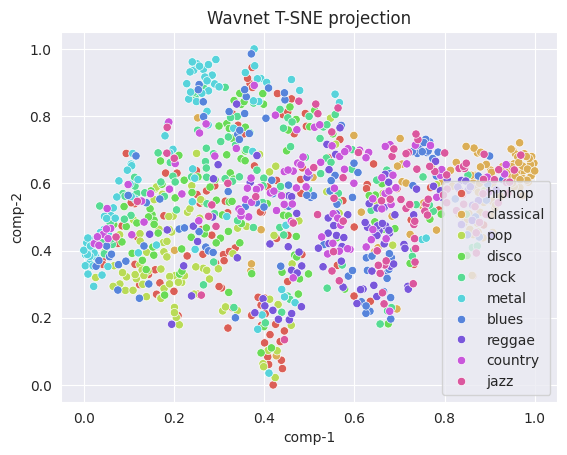

In [53]:

for i in range(len(tnse_embeddings_wavenet)):
    current_plot = i
    df["comp-1"] = tnse_embeddings_wavenet[current_plot].T[0]
    df["comp-2"] = tnse_embeddings_wavenet[current_plot].T[1]
    sns.scatterplot(x="comp-1", y="comp-2", hue=df.y.tolist(),
                palette=sns.color_palette("hls", 10),
                data=df).set(title="Wavnet T-SNE projection")
    plt.show()

In [54]:

import umap.umap_ as umap
reducer = umap.UMAP()

/home/golihn/anaconda3/envs/magenta_py38/lib/python3.8/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [55]:
def get_scaled_umap_embeddings(features, neighbour, distance):

    embedding = umap.UMAP(n_neighbors=neighbour,
                          min_dist=distance,
                          metric='correlation').fit_transform(features)
    scaler = MinMaxScaler()
    scaler.fit(embedding)
    return scaler.transform(embedding)


umap_embeddings_mfccs = []
umap_embeddings_wavenet = []
neighbours = [5, 10, 15, 30, 50]
distances = [0.000, 0.001, 0.01, 0.1, 0.5]
for i, neighbour in enumerate(neighbours):
    for j, distance in enumerate(distances):
        umap_mfccs = get_scaled_umap_embeddings(mfcc_features,
                                                neighbour,
                                                distance)
        umap_wavenet = get_scaled_umap_embeddings(wavenet_features,
                                                  neighbour,
                                                  distance)
        umap_embeddings_mfccs.append(umap_mfccs)
        umap_embeddings_wavenet.append(umap_wavenet)

        mfcc_key = 'umapmfcc{}{}'.format(i, j)
        wavenet_key = 'umapwavenet{}{}'.format(i, j)

        all_json[mfcc_key] = transform_numpy_to_json(umap_mfccs)
        all_json[wavenet_key] = transform_numpy_to_json(umap_wavenet)


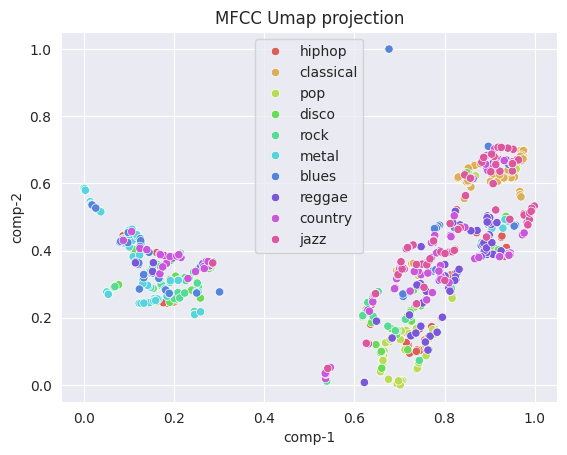

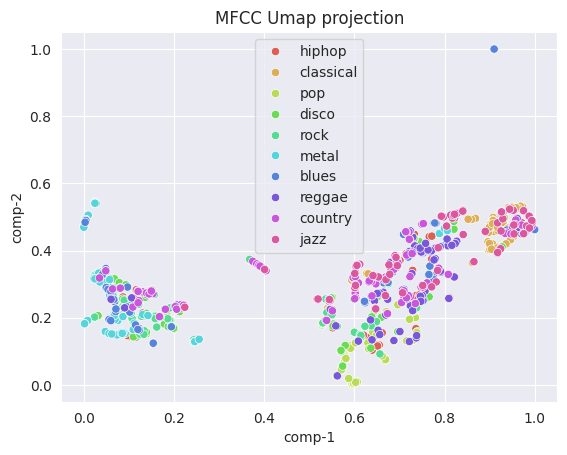

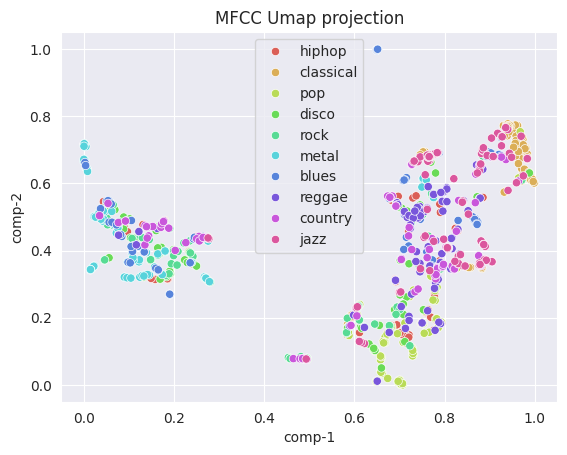

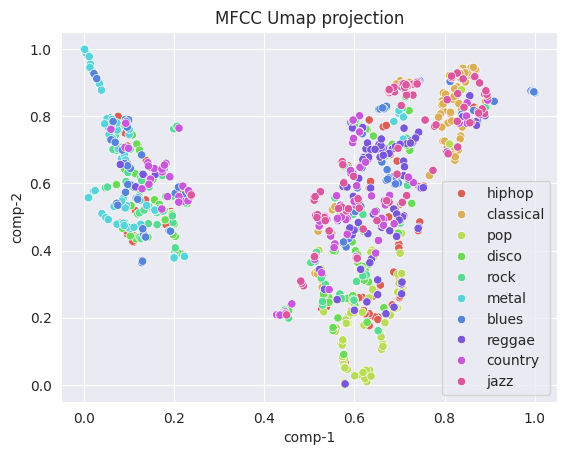

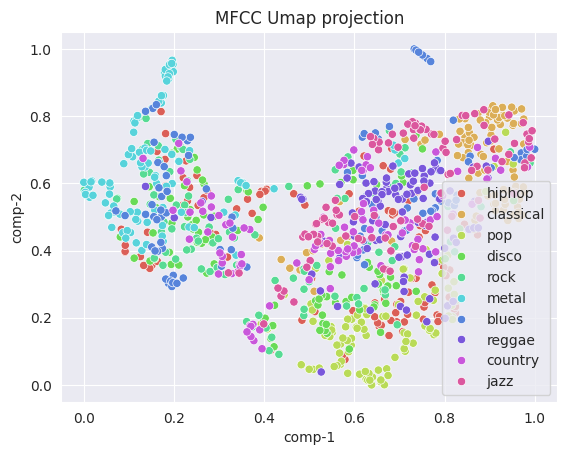

...

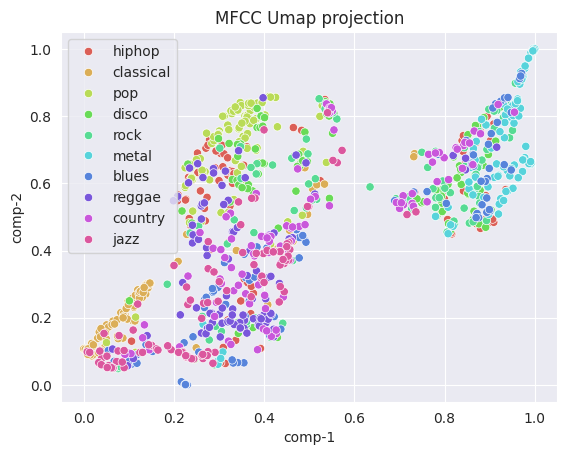

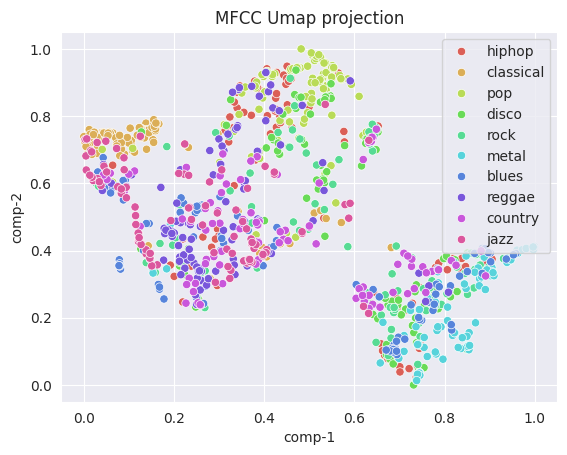

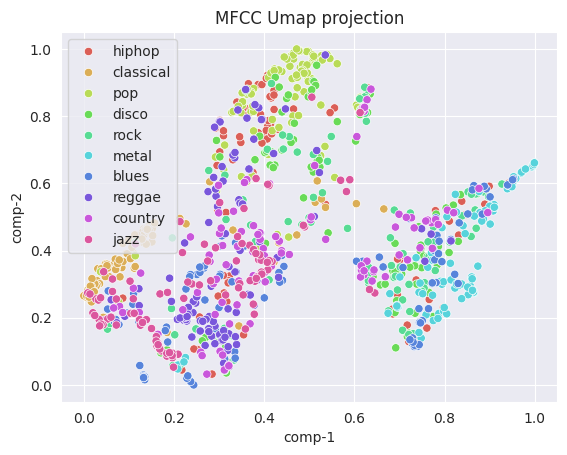

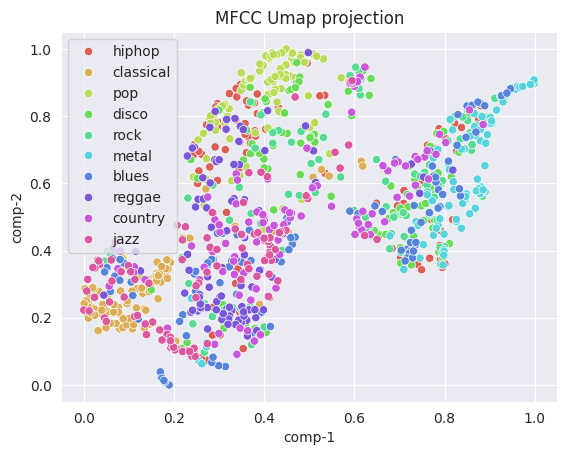

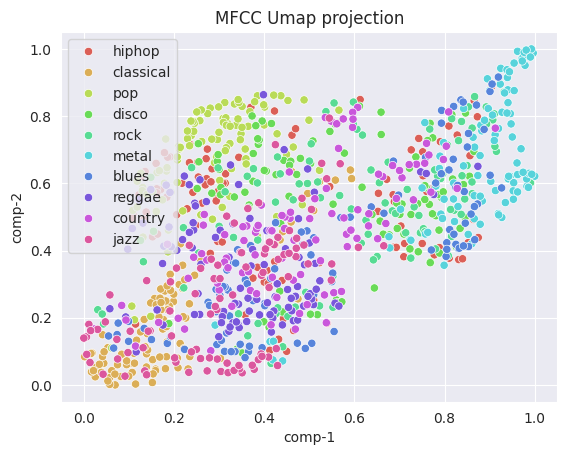

In [56]:

for i in range(25):
    current_plot = i
    df["comp-1"] = umap_embeddings_mfccs[current_plot].T[0]
    df["comp-2"] = umap_embeddings_mfccs[current_plot].T[1]
    sns.scatterplot(x="comp-1", y="comp-2", hue=df.y.tolist(),
                palette=sns.color_palette("hls", 10),
                data=df).set(title="MFCC Umap projection")
    plt.show()

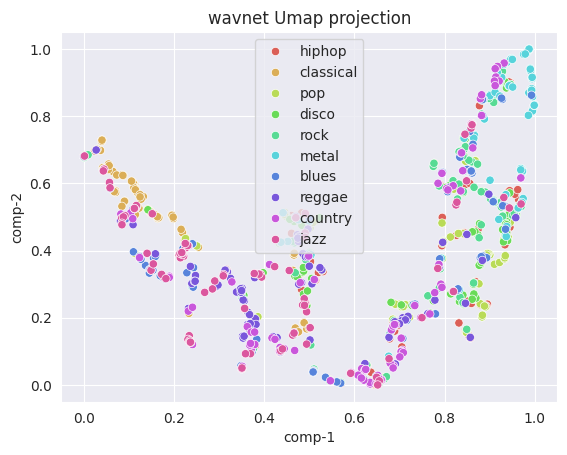

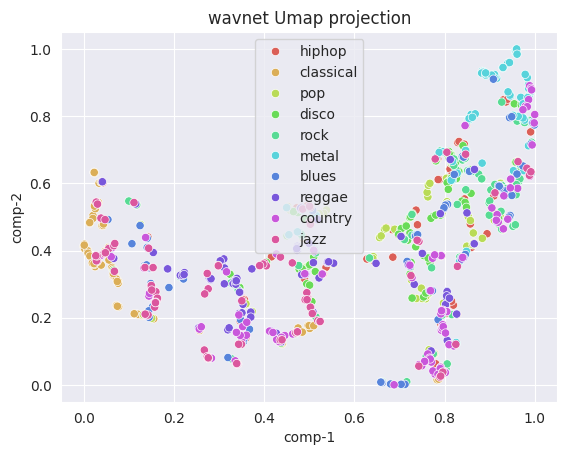

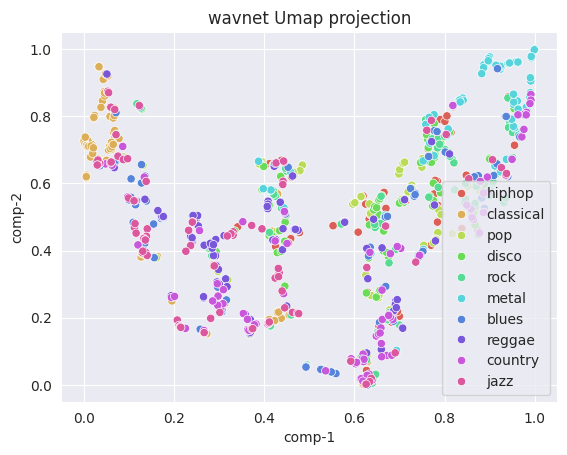

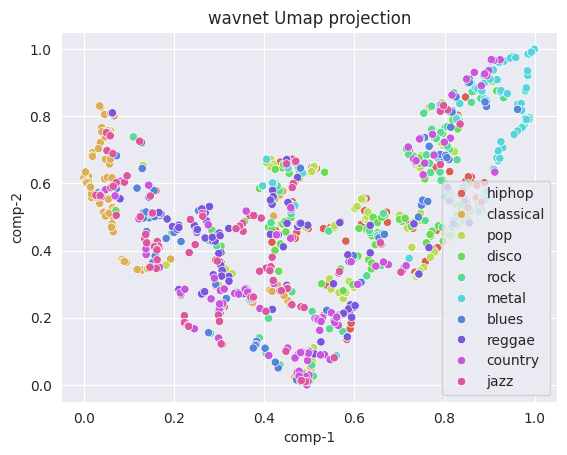

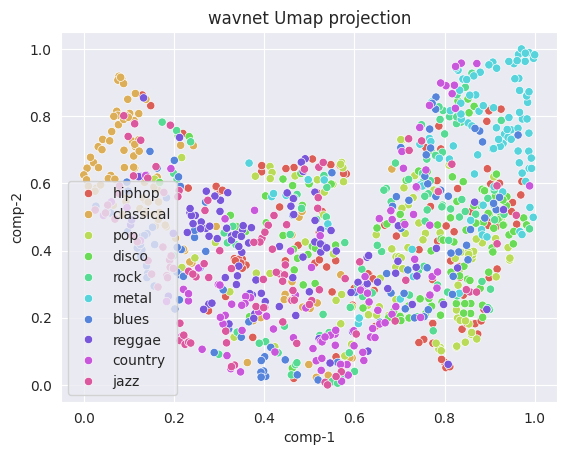

...

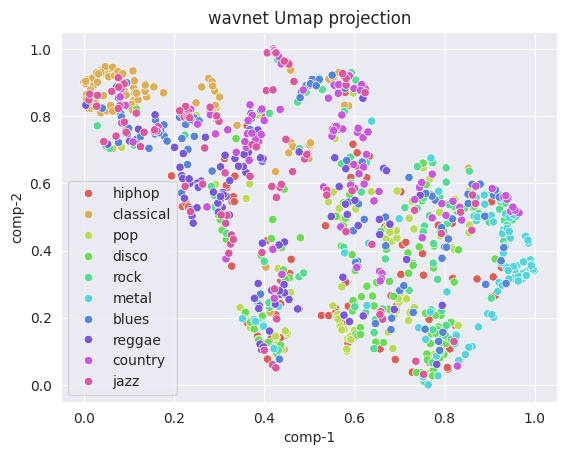

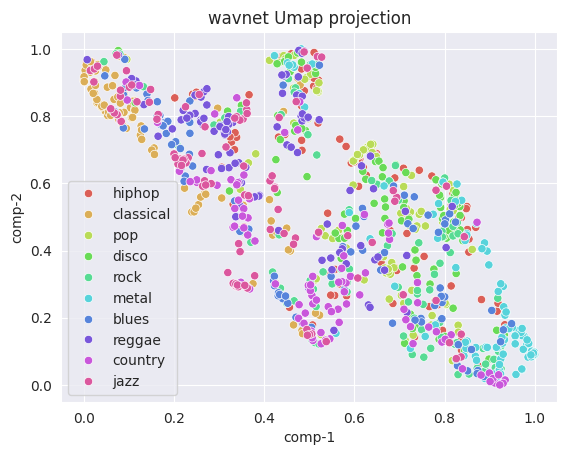

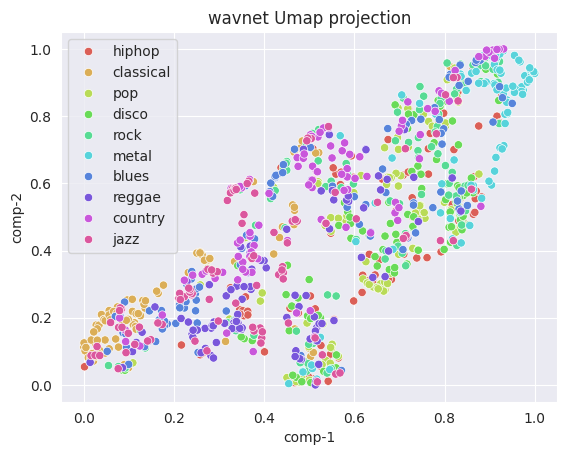

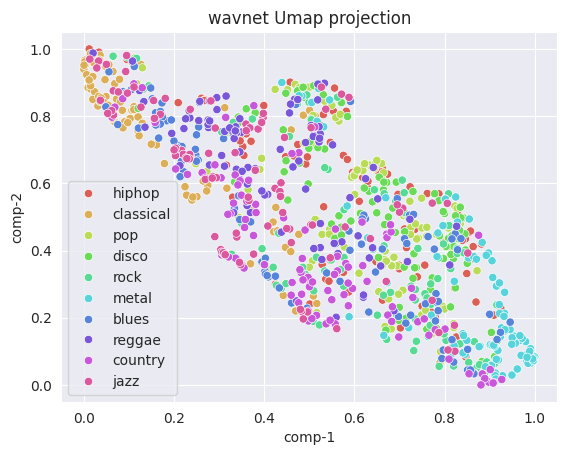

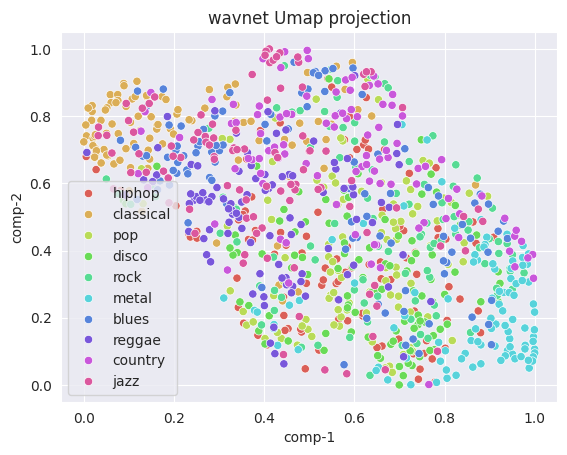

In [58]:

for i in range(25):
    current_plot = i
    df["comp-1"] = umap_embeddings_wavenet[current_plot].T[0]
    df["comp-2"] = umap_embeddings_wavenet[current_plot].T[1]
    sns.scatterplot(x="comp-1", y="comp-2", hue=df.y.tolist(),
                palette=sns.color_palette("hls", 10),
                data=df).set(title="wavnet Umap projection")
    plt.show()